In [1]:
!pip install Unidecode
!pip install fuzzysearch

!pip install elementpath
!pip install lxml 
!pip install graphviz
!pip install pydotplus

In [1]:
!ls ../../edspdf-train/data/publaynet/

dev.json xmls


# Sorting lines based on the xml files

In [2]:
from sort_xml import *
base_dir = '../../edspdf-train/data/publaynet/'

%load_ext autoreload
%autoreload 2

import sys
sys.executable

'/Users/souleymbaye/opt/anaconda3/envs/eds_env/bin/python'

### Load pdf and xml example 

In [4]:
!ls ../../edspdf-train/data/publaynet/xmls | head -n +25

PMC1087887
PMC1087888
PMC1241820
PMC1247186
PMC1247188
PMC1247189
PMC1247474
PMC1247478
PMC1247480
PMC1247485
PMC1247515
PMC1247517
PMC1247523
PMC1247562
PMC1247569
PMC1247570
PMC1247573
PMC1247606
PMC1247607
PMC1247608
PMC1247616
PMC1247620
PMC1247625
PMC1247658
PMC1247661


In [3]:
!ls ../../edspdf-train/data/publaynet/xmls/PMC1808441/

1748-7161-2-3-1.gif  1748-7161-2-3-2.jpg  1748-7161-2-3-S1.pdf
1748-7161-2-3-1.jpg  1748-7161-2-3-3.gif  1748-7161-2-3.nxml
1748-7161-2-3-2.gif  1748-7161-2-3-3.jpg  1748-7161-2-3.pdf


In [ ]:
PMC1247562 # exellent
PMC1247569 # exell b-37 --> (now ok)
PMC1247570 # title twice b-16, b-23
PMC1247573 # front, body et tables perfect (t0-(3,4), t5-(4,10,15,20)) 'Yes'/'No'
PMC1247606 # between b-7 and b-8, two missing nodes in the xml
PMC1247607 # body et tables perfect (t0-1, t0-1-1 et t0-1-3 --> same tb, No.% No.%, first No.%), see PMC1247474
PMC1247608 # erreur de parser sur table t1-1, body trop long (beaucoup de tbs)
PMC1247616
PMC1280340 # body et tables perfect
PMC1247620 # 6min trop long
PMC1247625 # perfect (0 table)
PMC1247658 # 3min



1

In [465]:
file_dir = base_dir + 'xmls/PMC1247474'
pdf_path, xml_path = get_paths(file_dir = file_dir)
print(f'xml path: {xml_path}\npdf path: {pdf_path}')


xml path: ../../edspdf-train/data/publaynet/xmls/PMC1247474/ehp0112-001152.nxml
pdf path: ../../edspdf-train/data/publaynet/xmls/PMC1247474/ehp0112-001152.pdf


## Model extractor

2

In [466]:
from edspdf import Pipeline
from edspdf.structures import Box, PDFDoc
from edspdf.visualization.annotations import show_annotations

# model
model = Pipeline()
model.add_pipe("pdfminer-extractor", config=dict(extract_style="true"), name="extractor")

# Read PDF
pdf = pdf_path.read_bytes()
doc: PDFDoc = model.get_pipe("extractor")(pdf)

dict_page_text_boxes = {}
for tb in doc.content_boxes:
    if tb.page_num not in dict_page_text_boxes:
        dict_page_text_boxes[tb.page_num] = []
    dict_page_text_boxes[tb.page_num].append(tb)
print(f'Nb pages {len(dict_page_text_boxes)}')
# pages = [page for page in show_annotations(doc.content, doc.content_lines)]
# for page in show_annotations(doc.content, doc.content_boxes):
#     display(page)

Nb pages 7


#### Display XML

3

In [467]:
# Read XML
xml = open(xml_path, 'rb')
tree = etree.parse(xml)
# root = tree.getroot()

printXML(tree)

<!DOCTYPE article PUBLIC "-//NLM//DTD JATS (Z39.96) Journal Archiving and Interchange DTD v1.0 20120330//EN" "JATS-archivearticle1.dtd">
<article xmlns:xlink="http://www.w3.org/1999/xlink" xmlns:mml="http://www.w3.org/1998/Math/MathML" article-type="research-article">
  <?properties open_access?>
  <front>
    <journal-meta>
      <journal-id journal-id-type="nlm-ta">Environ Health Perspect</journal-id>
      <journal-id journal-id-type="iso-abbrev">Environ. Health Perspect</journal-id>
      <journal-title-group>
        <journal-title>Environmental Health Perspectives</journal-title>
      </journal-title-group>
      <issn pub-type="ppub">0091-6765</issn>
      <issn pub-type="epub">1552-9924</issn>
      <publisher>
        <publisher-name>National Institue of Environmental Health Sciences</publisher-name>
      </publisher>
    </journal-meta>
    <article-meta>
      <article-id pub-id-type="pmid">15289159</article-id>
      <article-id pub-id-type="pmc">1247474</article-id>
    

#### Font, Body and tables text nodes

##### Front nodes matching

4

In [468]:
xml_front_nodes = get_front_nodes(tree)

print(f'\n\nNb nodes {len(xml_front_nodes)}')
for id,xml_node in enumerate(xml_front_nodes):
    printXML(xml_node)

front_nodes = []
for id,xml_node in enumerate(xml_front_nodes):
    node = Node(xml_node, id, color='yellow', bg_color='black', r0='f', entropie_threshold=0.1, type='front')
    front_nodes.append(node)
    
front_nodes = tqdm(front_nodes, mininterval=1)



Nb nodes 5
<article-title xmlns:xlink="http://www.w3.org/1999/xlink" xmlns:mml="http://www.w3.org/1998/Math/MathML">Age-Related Differences in Susceptibility to Carcinogenesis: A Quantitative Analysis of Empirical Animal Bioassay Data</article-title>

<contrib-groups>
  <new-name>
    <given-names>Dale</given-names>
    <surname>Hattis</surname>
  </new-name>
  <vigule>,</vigule>
  <xref ref-type="aff" rid="af1-ehp0112-001152">
    <sup>1</sup>
  </xref>
  <new-name>
    <given-names>Robert</given-names>
    <surname>Goble</surname>
  </new-name>
  <vigule>,</vigule>
  <xref ref-type="aff" rid="af1-ehp0112-001152">
    <sup>1</sup>
  </xref>
  <new-name>
    <given-names>Abel</given-names>
    <surname>Russ</surname>
  </new-name>
  <vigule>,</vigule>
  <xref ref-type="aff" rid="af1-ehp0112-001152">
    <sup>1</sup>
  </xref>
  <new-name>
    <given-names>Margaret</given-names>
    <surname>Chu</surname>
  </new-name>
  <vigule>,</vigule>
  <xref ref-type="aff" rid="af2-ehp0112-00115

  0%|          | 0/5 [00:00<?, ?it/s]

5 ---> rematch 1

In [469]:
for tb in doc.content_boxes:
    tb.rank = None
    tb.inode = None

6

In [470]:
for node in front_nodes:
    node.reset()

get_matches(front_nodes, dict_page_text_boxes, v=False)

100%|██████████| 5/5 [00:04<00:00,  1.10it/s]


7

In [471]:
n_tt = len(front_nodes)
n_mt = len([0 for node in front_nodes if node.full])
print(f'Front\n  Nb nodes total {n_tt}\n  Nb nodes matched {n_mt}\n  Nb nodes not matched {n_tt-n_mt}')
for node in front_nodes:
    if not node.full:
        print(f'    {node.id}  `{node.text}`')

Front
  Nb nodes total 5
  Nb nodes matched 5
  Nb nodes not matched 0


In [419]:
# id = 0
# for node in front_nodes:
#     if node.id == id:
#         break

# node.print_node()

##### Body nodes matching

8 --> one execution

In [472]:
# executer une seule fois sionon erreur
# moins de noeuds retournes

qbody='//body//title | //body//p'
r = elementpath.select(tree, qbody)
r2 = []

jump = False
for i,node in enumerate(r):
    if jump:
        jump = False
        continue
    if node.tag == 'title' and r[1+i].tag == 'p':
        sec = etree.Element('sec')
        sec.append(node)
        sec.append(r[1+i])
        r2.append(sec)
        jump = True
    else:
        r2.append(node)

xml_body_nodes = r2

body_nodes = []
for id, xml_node in enumerate(xml_body_nodes):
    node = Node(xml_node, id, color='black', bg_color='cyan', r0='b', type='body')
    body_nodes.append(node)
body_nodes = tqdm(body_nodes, mininterval=1)

  0%|          | 0/54 [00:00<?, ?it/s]

9

In [473]:
for node in body_nodes:
    node.reset()

get_matches(body_nodes, dict_page_text_boxes, v=False)

100%|██████████| 54/54 [00:01<00:00, 27.48it/s]

10

In [475]:
n_tt = len(body_nodes)
n_mt = len([0 for node in body_nodes if node.full])
print(f'Body\n  Nb nodes total {n_tt}\n  Nb nodes matched {n_mt}\n  Nb nodes not matched {n_tt-n_mt}')
for node in body_nodes:
    if not node.full:
        print(f'    {node.id}  `{node.text}`')

Body
  Nb nodes total 54
  Nb nodes matched 54
  Nb nodes not matched 0


Introduction

Contex
Datset
Model


11 --> copy

In [476]:
inode_copy = []
for tb in doc.content_boxes:
    inode_copy.append(tb.inode)

In [424]:
# id = 4
# for node in body_nodes:
#     if node.id == id: break
# printXML(node.xml_node)
# node.print_node()

In [425]:
# tbs = []
# for tb in doc.content_boxes:
#     if tb.inode is None and tb.page_num == 2:
#         print(f'`{tb.text}` {tb}')
#         tbs.append(tb)
# tb = tbs[1]

# print(f'\n`{tb.text}` {tb}')

In [426]:

# delete_white_spaces(unidecode(" ".join(node.xml_node.itertext()))), \
# delete_white_spaces(unidecode(tb.text))

##### Tables nodes matching

12 --> one execution

In [477]:
# one execution

qtables='//table-wrap'
tables_nodes=elementpath.select(tree, qtables)


qtable='//label | //caption | //tr | //table-wrap-foot'
xml_table_nodes = [
    [
        node for node in one_tns if "".join(node.itertext()) != ""
    ]
    for one_tns in [elementpath.select(table_tree, qtable) for table_tree in tables_nodes]
]

# Merging label and caption
for itable in range(len(xml_table_nodes)):
    label = None
    caption = None
    lc = None
    for ind,node in enumerate(xml_table_nodes[itable]):
        if node.tag == 'label':
            label = (ind,node)
        if node.tag == 'caption':
            caption = (ind,node)
        if label is not None and caption is not None:
            lc = etree.Element('label_caption')
            lc.append(deepcopy(label[1]))
            lc.append(deepcopy(caption[1]))
            xml_table_nodes[itable][label[0]] = lc
            xml_table_nodes[itable] = xml_table_nodes[itable][:caption[0]] + xml_table_nodes[itable][1+caption[0]:]
            break

# delete other label tags
table_nodes_ = []
for table in xml_table_nodes:
    tk_nodes = []
    for node in table:
        if node.tag != 'label':
            tk_nodes.append(node)
    table_nodes_.append(tk_nodes)
    
xml_table_nodes = table_nodes_

table_nodes = []
for itable,xml_t in enumerate(xml_table_nodes):
    t_nodes = []
    for id,xml_node in enumerate(xml_t):
        node = Node(xml_node, id, color='red', bg_color='white', r0=f't{itable}-', type='table')
        t_nodes.append(node)
    t_nodes = tqdm(t_nodes, mininterval=1)
    table_nodes.append(t_nodes)

  0%|          | 0/7 [00:00<?, ?it/s]



































































In [428]:
# itable = 0
# print(f'Nb nodes of table {itable}: {len(xml_table_nodes[itable])}\n')
# for inode,node in enumerate(xml_table_nodes[itable]):
#     print(f'{node.tag} {inode}\n  `{" | ".join(node.itertext())}`\n')
#     # printXML(node)
#     print('------------------')

13 --> backup

In [503]:
# backup tb.inode
for tb,inode in zip(doc.content_boxes, inode_copy):
    tb.inode = inode
    if inode is None:
        tb.rank = None

14

In [504]:

# for ic,tb in zip(inode_copy,doc.content_boxes):
#     tb.inode = ic
for t_nodes in table_nodes:
    for node in t_nodes:
        node.reset()
    
    get_matches(t_nodes, dict_page_text_boxes, v=False)

# itable = 0
# _tdb = get_matches(table_nodes[itable], dict_page_text_boxes, color='red', bg_color='white',v=False, r0=f't{itable}-')

Avant tri table
  Nb blocs 2
  Node (5 not complete) text: ` Weaning-60-days (39 days) 0.000 0.000 0.24`
  bloc 840
    Id 840 nb tbs 1
    Text: `weaning`
    merged ids: `{'8', '0', '4'}`
       0 p-1 `weaning` 		-> [Match(start=0, end=7, dist=0, matched='weaning')] TextBox(x0=0.7454609477124184, x1=0.7860857843137256, y0=0.7594840909090909, y1=0.769585101010101, label=None, page_num=1, text='weaning', props=[TextProperties(italic=False, bold=False, begin=0, end=7, fontname='ANODNN+Univers-CondensedLight')])
  bloc 841
    Id 841 nb tbs 1
    Text: `days`
    merged ids: `{'8', '4', '1'}`
       0 p-1 `days` 		-> [Match(start=11, end=15, dist=0, matched='days'), Match(start=18, end=22, dist=0, matched='days')] TextBox(x0=0.8191550653594772, x1=0.8409250000000003, y0=0.7594840909090909, y1=0.769585101010101, label=None, page_num=1, text='days', props=[TextProperties(italic=False, bold=False, begin=0, end=4, fontname='ANODNN+Univers-CondensedLight')])

Après tri
  Nb blocs 2
  Node (5 

15

In [497]:
print(f'Nb tables {len(table_nodes)}')
for itable in range(len(table_nodes)):
    # itable = 0
    
    tk_nodes = table_nodes[itable]
    # tk_nodes_blocs, tk_dict_blocs = _tdb    #   table_dict_blocks[itable]

    n_tt = len(tk_nodes)
    n_mt = len([0 for node in tk_nodes if node.full])
    print(f'Table {itable}\n  Nb nodes total {n_tt}\n  Nb nodes matched {n_mt}\n  Nb nodes not matched {n_tt-n_mt}')
    for node in tk_nodes:
        if not node.full:
            print(f'    {node.id}  `{node.text}`')
    
    # break

Nb tables 13
Table 0
  Nb nodes total 7
  Nb nodes matched 6
  Nb nodes not matched 1
    2  `Dosing protocol No. of chemicals or radiation types Total dose groups Control groups Fetal Birth-weaning Weaning-60 days Adult (>= 60 days)`
Table 1
  Nb nodes total 5
  Nb nodes matched 5
  Nb nodes not matched 0
Table 2
  Nb nodes total 15
  Nb nodes matched 14
  Nb nodes not matched 1
    5  ` Weaning-60-days (39 days) 0.000 0.000 0.24`
Table 3
  Nb nodes total 11
  Nb nodes matched 11
  Nb nodes not matched 0
Table 4
  Nb nodes total 11
  Nb nodes matched 11
  Nb nodes not matched 0
Table 5
  Nb nodes total 11
  Nb nodes matched 10
  Nb nodes not matched 1
    1  `Sex and age group Maximum likelihood estimate 95% LCL 95% UCL`
Table 6
  Nb nodes total 11
  Nb nodes matched 10
  Nb nodes not matched 1
    1  `Sex and age group Maximum likelihood estimate 95% LCL 95% UCL`
Table 7
  Nb nodes total 11
  Nb nodes matched 10
  Nb nodes not matched 1
    1  `Sex and age group Maximum likelihood es

In [501]:
# inode never matched fails because therefore inode not in _dict_blocs
itable = 2
id = 0
tk_nodes = table_nodes[itable]

# tk_nodes_blocs, tk_dict_blocs = _tdb    #  table_dict_blocks[itable]# 
for node in tk_nodes:
    if node.id == id: break

node.print_node()

Nb blocs 1
Node (0 complete) text: `Table 3 Summary of results from fitting cancer bioassay data: relative susceptibility of different life stages per day of dosing.`
complete bloc
  Id 146 nb tbs 2
  Text: `Table 3. Summary of results from fitting cancer bioassay data: relative susceptibility of different life stages - per day of dosing.`
  merged ids: `{'6', '4', '1'}`
     0 p-3 `Table 3. Summary of results from fitting cancer bioassay data: relative susceptibility of different life stages` 		-> [Match(start=0, end=95, dist=1, matched='table3summaryofresultsfromfittingcancerbioassaydata:relativesusceptibilityofdifferentlifestages')] TextBox(x0=0.36519607843137253, x1=0.920725490196078, y0=0.2899979797979798, y1=0.30036161616161616, label=None, page_num=3, text='Table 3. Summary of results from ﬁtting cancer bioassay data: relative susceptibility of different life stages', props=[TextProperties(italic=False, bold=True, begin=0, end=8, fontname='ANMFID+Univers-CondensedBold'), TextPro

In [439]:
tb_match_('X', ' Draft sections 2-4 x x')

False

#### Ranked text boxes

16

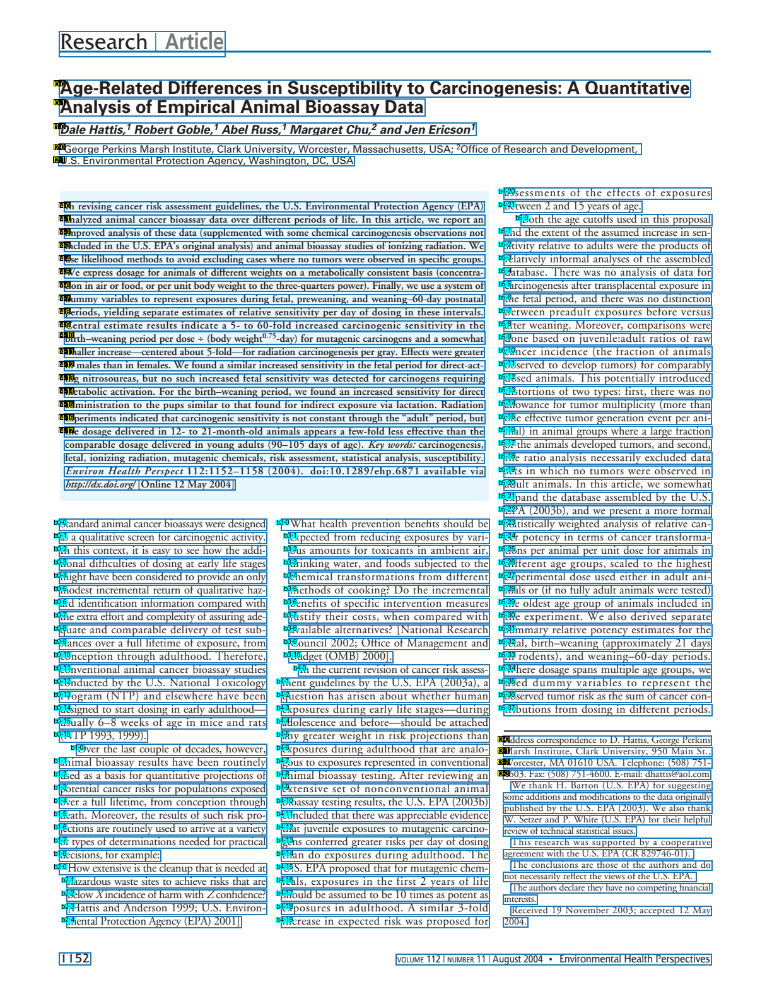

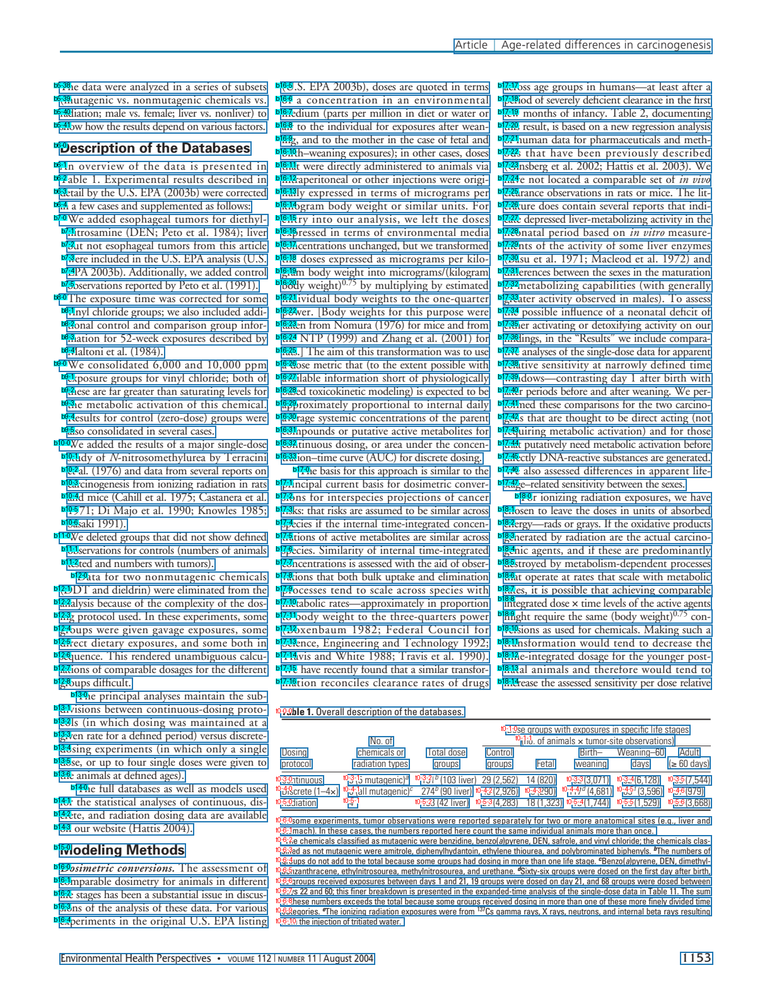

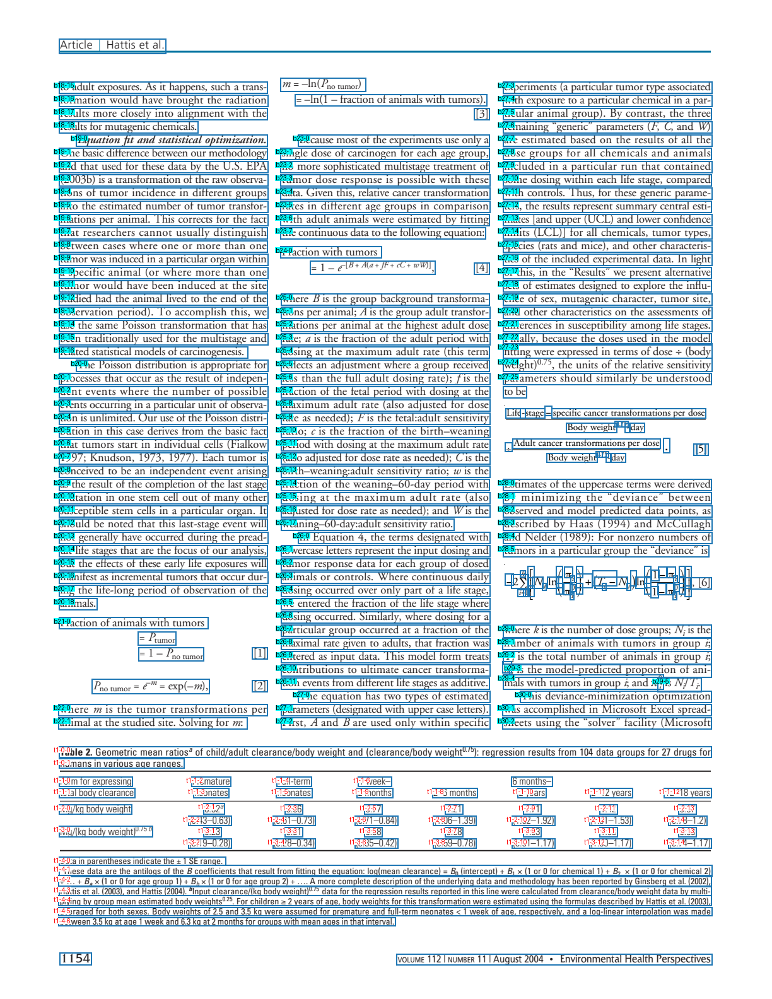

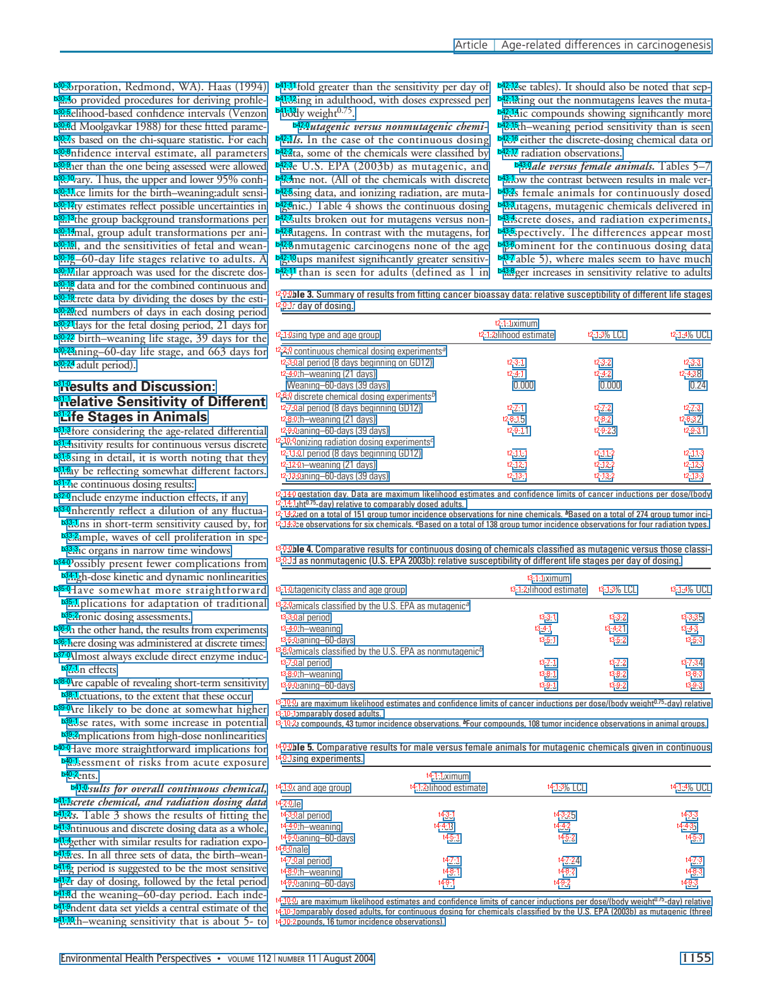

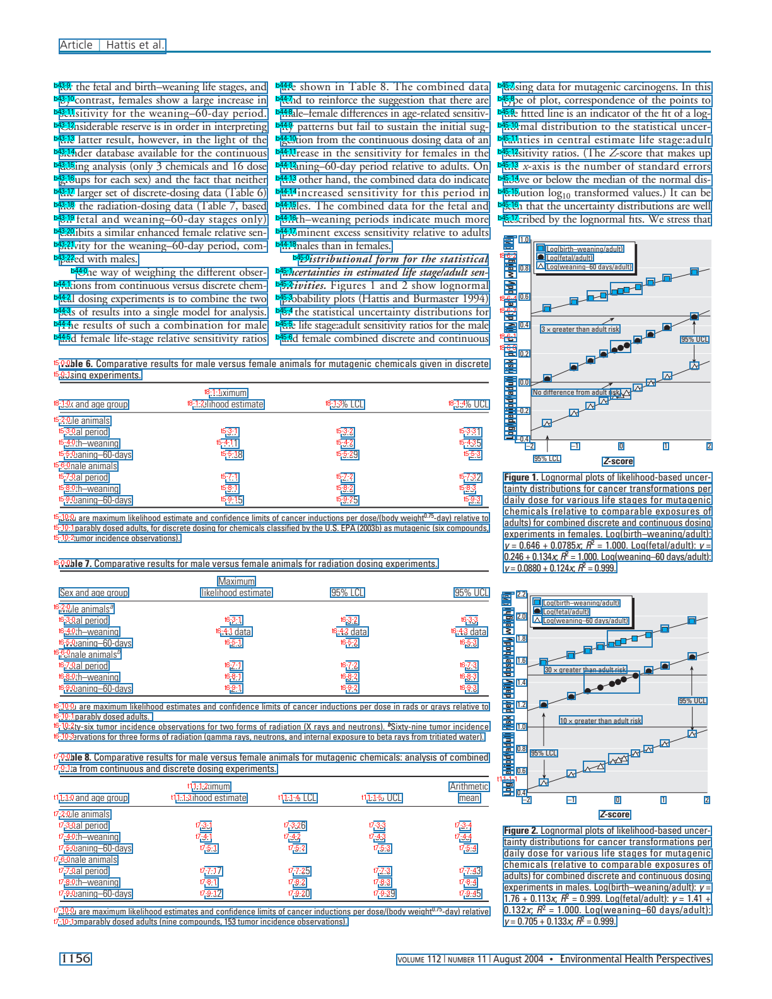

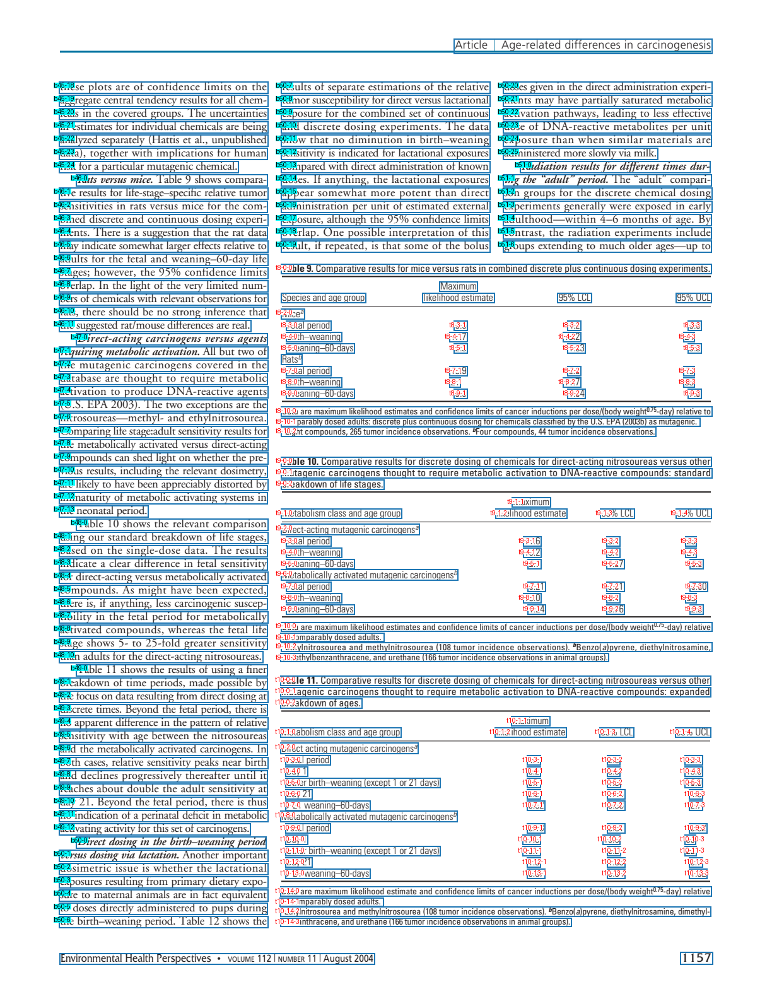

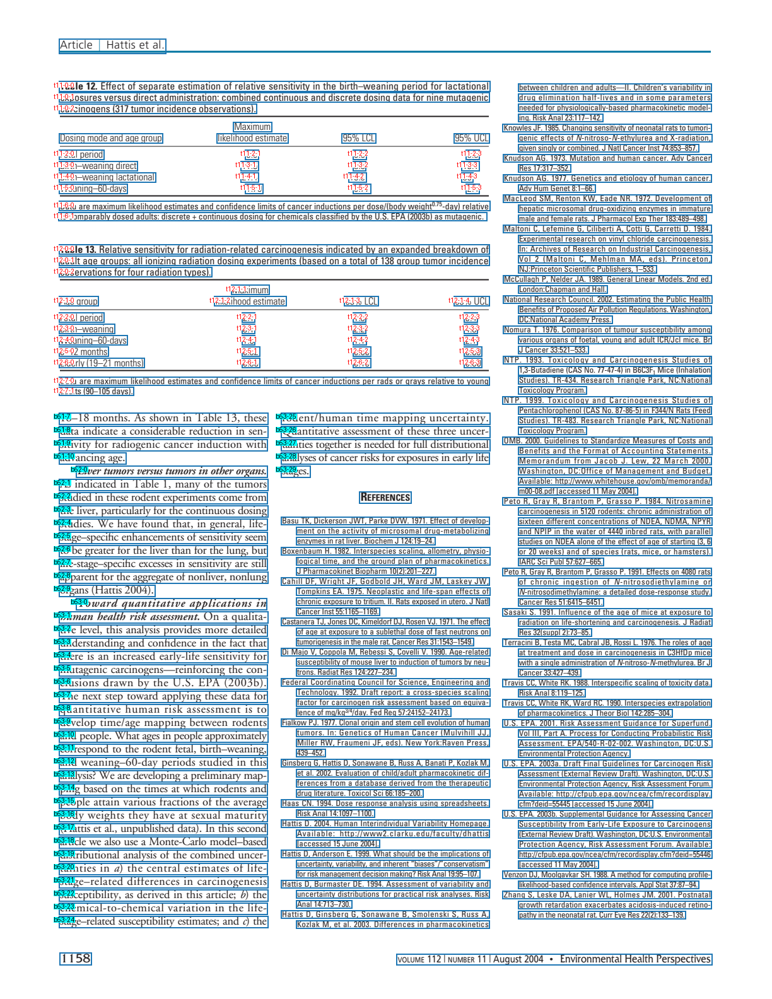

In [493]:
for page in show_annotations(doc.content, doc.content_boxes):
    display(page)